In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

### Import Dataset

In [2]:
df = pd.read_csv("./dataset/regression/insurance.csv")

df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


### Convert into numerical values

In [3]:
df['sex'] = df['sex'].astype('category')
df['sex'] = df['sex'].cat.codes

df['region'] = df['region'].astype('category')
df['region'] = df['region'].cat.codes

df['smoker'] = df['smoker'].astype('category')
df['smoker'] = df['smoker'].cat.codes

df.head(15)

,age,sex,bmi,children,smoker,region,charges
0,19,0,27.900,0,1,3,16884.92400
1,18,1,33.770,1,0,2,1725.55230
2,28,1,33.000,3,0,2,4449.46200
3,33,1,22.705,0,0,1,21984.47061
4,32,1,28.880,0,0,1,3866.85520
5,31,0,25.740,0,0,2,3756.62160
6,46,0,33.440,1,0,2,8240.58960
7,37,0,27.740,3,0,1,7281.50560
8,37,1,29.830,2,0,0,6406.41070
9,60,0,25.840,0,0,1,28923.13692


In [5]:
df.isnull().sum()

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64

### Extract predictors and response variable

In [71]:
x_vector = df.drop(columns='charges')[0: 100]
y = df.loc[:, 'charges'][0: 100]

In [72]:
print("X shape:", x_vector.shape)
print("Y shape:", y.shape)

X shape: (100, 6)
Y shape: (100,)


### Train: Multiple Linear Regression with SKLearn

In [73]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

x_train, x_test, y_train, y_test = train_test_split(x_vector, y, test_size=0.3,random_state=0)

model = LinearRegression()
model.fit(x_train, y_train)

y_pred = model.predict(x_train)

print("w:", model.coef_)
print("b:", model.intercept_)

w: [  257.14217692  1508.06828445   506.85080043   400.74887539
 24330.64641911   258.8294883 ]
b: -19549.60868104212


### Get the R2 Score of predicted Y with true Y

In [74]:
from sklearn.metrics import r2_score

r2_score(y_train, y_pred)

0.8340553625971011

### Visualize the deviation of predicted Y with true Y

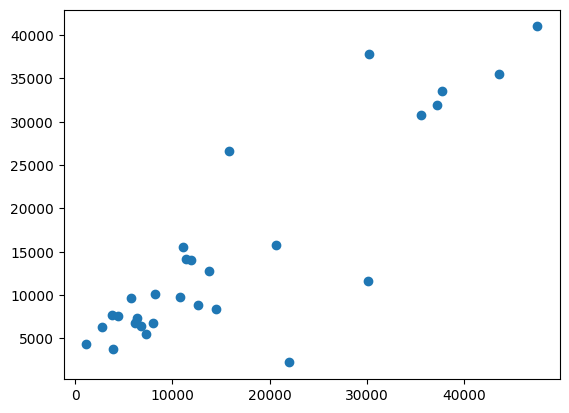

In [75]:
y_hat = model.predict(x_test)
plt.scatter(y_test, y_hat)
plt.show()

In [84]:
row_size = x_train.shape[0]
m = row_size

### Define the derivatives of J(w, b) with respect to w and b

In [77]:
def dJw(x: pd.DataFrame, y: pd.Series, w: np.ndarray, b: np.ndarray, j: int):
    _sum = 0
    for i in range(m):
        y_hat = np.dot(x.iloc[i], w) + b
        err = (y_hat - y.iloc[i]) * x.iloc[i,j]
        _sum += err
    return _sum / m

def dJb(x: pd.DataFrame, y: pd.Series, w: np.ndarray, b: np.ndarray):
    _sum = 0
    for i in range(m):
        y_hat = np.dot(x.iloc[i], w) + b
        err = (y_hat - y.iloc[i])
        _sum += err
    return _sum / m

#### Train: Multiple Linear Regression (implemented from scratch)

In [83]:
def fit(x: pd.DataFrame, y: pd.Series):
    w = np.zeros(x_vector.shape[1])
    b = np.array(0, dtype=np.longdouble)

    a = 0.0015
    n = w.size

    temp_w = np.zeros(x_vector.shape[1])
    temp_b = np.array(0, dtype=np.longdouble)

    while True:
        for j in range(n):
            temp_w[j] = w[j] - a * dJw(x, y, w, b, j)
            temp_b = b - a * dJb(x, y, w, b)
            w[j] = temp_w[j]
            b = temp_b

        print("w:", w)
        print("b:", b)
        print("----")

fit(x_train, y_train)

w: [ 876.53928601   -8.91951384 -836.16161512   10.23563368   10.34378018
   22.41228534]
b: -3.107493259493836
----
w: [1082.12269579   -5.73524457 -805.78620864    6.15599802   16.91637702
   23.7755909 ]
b: -1.8776873611040594
----
w: [ 740.81914646    4.48191421 -232.65562682   -5.02082217   21.52385728
   13.24939172]
b: -0.19001992050968397
----
w: [234.81700313  14.57162345 374.34365473 -14.71340699  26.41623821
   3.31067202]
b: -0.8035295455294644
----
w: [-98.0874745   19.97897461 667.85130461 -18.19961033  32.88750778
   1.68758582]
b: -4.229772016671494
----
w: [-135.34206966   20.34752776  596.68217509  -15.85789097   40.89951781
    8.77288709]
b: -9.24626362567067
----
w: [ 38.90543476  18.22921149 329.20082478 -11.15179456  49.57485898
  20.00499235]
b: -14.185836537302459
----
w: [253.49143281  16.64476484  82.57108028  -7.62429271  57.97872151
  30.14216049]
b: -18.014954197137985
----
w: [375.59335594  17.24926125 -14.47286095  -6.91276882  65.65554784
  36.39855486]

KeyboardInterrupt: 